# Image Clustering & Deduplication with ResNet50 and K-Means

This notebook implements a pipeline to identify and remove screenshots, detect duplicate images, and select a single “original” per duplicate set by combining:

- **ResNet50 embeddings** for fixed-length feature extraction  
- **K-Means clustering** to separate screenshots (and other broad categories)  
- **Cosine similarity** within clusters to group near-duplicates  
- **Engagement-based scoring** (likes, views, shares, comments) to pick the highest-value image in each duplicate set  

## Initial Considerations: Screenshot vs. Content Images

We first observed a distinct cluster of UI-style screenshots that do not convey social or news content. Removing them early avoids wasted compute on irrelevant images:

- **Cluster identification**: K-Means (k=7) on ResNet50 features reliably isolates screenshots  
- **Exception handling**: A small whitelist of screenshot IDs may be retained if needed  
- **Simpler rule-based filtering** outperforms prompt-based or metadata-only approaches  

## Pipeline Overview

1. **Data Loading & Validation**  
   - Read raw CSV with `incident_id`, `format`, and engagement metrics  
   - Check that the image folder exists and that all expected IDs map to files  

2. **Screenshot Removal**  
   - Extract ResNet50 embeddings for every image  
   - Run K-Means → identify the “screenshot” cluster  
   - Discard most images in that cluster, with optional overrides  

3. **Feature Extraction for Clustering & Deduplication**  
   - Reload kept images and preprocess for ResNet50 (`224×224`)  
   - Compute averaged embeddings from the `avg_pool` layer  

4. **K-Means Clustering**  
   - Fit K-Means (k=7) on the embedding set  
   - Visualize sample images per cluster to verify grouping quality  

5. **Duplicate Detection within Clusters**  
   - Compute cosine similarity matrix for each cluster  
   - Threshold (e.g. > 0.93) to find near-duplicate pairs  
   - Use a Union-Find algorithm to group images into duplicate sets  

6. **Engagement-Based Original Selection**  
   - Sum cleaned engagement metrics (`likes`, `views`, `comments`, `shares`)  
   - Within each duplicate set, mark the image with highest total engagement as the “original”  
   - Label others as duplicates  

7. **Results Aggregation & Export**  
   - Build an expanded DataFrame (one row per image) with deduplication flags  
   - Save both intermediate (per‐cluster & per‐duplicate) and final CSVs to Drive  
   - Provide summary counts of kept vs. discarded images  

## Special Focus: Engagement-Weighted Deduplication

By using real engagement data to choose among near-duplicates, we:

- **Maximize information retention**: keep the image that drove the most user interaction  
- **Avoid arbitrary selection**: engagement sums are a principled, reproducible tiebreaker  
- **Support downstream analysis**: all duplicates are tracked, but only the “original” flows into final datasets  

Thresholds and cluster counts can be tuned as needed, but this combined embedding + cluster + similarity + engagement strategy yields a clean, high-value image corpus ready for analysis.  

In [1]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import re
import numpy as np
print("NumPy version:", np.__version__)

import math
import pandas as pd
from PIL import Image, ImageFile
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.models import Model

from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm

if tf.test.gpu_device_name():
    print('GPU found:', tf.test.gpu_device_name())
else:
    print('No GPU found. Please select a GPU runtime.')

NumPy version: 2.0.2
GPU found: /device:GPU:0


## Data verification

In [3]:
csv_path = "/content/drive/MyDrive/CSM 2025/data/data-2324-no-ver.csv"
df = pd.read_csv(csv_path)

print("--- Data Verification Steps ---")

# 1. Number of rows
num_rows = len(df)
print(f"1. Number of rows: {num_rows}")

# 2. Range of 'date_posted'
if 'date_posted' in df.columns:
    try:
        # Convert to datetime, coercing errors will turn unparseable dates into NaT
        df['date_posted'] = pd.to_datetime(df['date_posted'], errors='coerce')
        # Drop rows where date conversion failed to avoid issues with min/max
        valid_dates = df['date_posted'].dropna()
        if not valid_dates.empty:
            date_posted_min = valid_dates.min()
            date_posted_max = valid_dates.max()
            print(f"2. Range of 'date_posted': {date_posted_min} to {date_posted_max}")
        else:
            print("2. 'date_posted' column contains no valid dates after conversion.")
    except Exception as e:
        print(f"2. Error processing 'date_posted' column: {e}")
else:
    print("2. Column 'date_posted' not found.")

# 3. Unique values under 'type'
if 'type' in df.columns:
    unique_types = df['type'].unique()
    print(f"3. Unique values in 'type': {unique_types}")
else:
    print("3. Column 'type' not found.")

--- Data Verification Steps ---
1. Number of rows: 714
2. Range of 'date_posted': 2023-02-13 00:00:00 to 2024-12-19 00:00:00
3. Unique values in 'type': ['deepfake']


In [4]:
image_folder_path = "/content/drive/MyDrive/CSM 2025/images"

# --- Helper Function to Safely Convert ID Column to String ---
def ensure_id_column_is_string(dataframe, id_column_name='incident_id'):
    if id_column_name in dataframe.columns:
        if not pd.api.types.is_string_dtype(dataframe[id_column_name]):
            try:
                dataframe[id_column_name] = dataframe[id_column_name].astype(str)
            except Exception as e:
                print(f"Warning: Could not convert column '{id_column_name}' to string: {e}")
    return dataframe

# --- Initial Checks and Setup ---
if 'df' not in locals() or not isinstance(df, pd.DataFrame):
    print("Error: DataFrame 'df' is not loaded or is not a valid DataFrame. Please load it first.")
elif 'incident_id' not in df.columns or 'format' not in df.columns:
    print("Error: DataFrame 'df' must contain 'incident_id' and 'format' columns.")
else:
    print(f"Initial number of rows in df: {len(df)}")

    # --- Part 1: Informational Check - Unrepresented Image IDs ---
    print("\n--- Part 1: Checking for Unrepresented Image IDs (Informational) ---")
    all_files_in_folder = []
    if os.path.exists(image_folder_path):
        all_files_in_folder = os.listdir(image_folder_path)
        print(f"Found {len(all_files_in_folder)} total files in '{image_folder_path}'.")
    else:
        print(f"Error: Image folder not found at {image_folder_path}. Cannot check for unrepresented IDs.")

    if all_files_in_folder:
        df_check_images = df[df['format'] == 'image'].copy()
        df_check_images = ensure_id_column_is_string(df_check_images, 'incident_id')

        relevant_ids_for_check = set(df_check_images['incident_id'])
        print(f"Found {len(relevant_ids_for_check)} unique 'incident_id's with 'format' == 'image' for initial check.")

        image_base_names_in_folder = set()
        for filename in all_files_in_folder:
            name_part = os.path.splitext(filename)[0]
            base_name = re.sub(r'_\d+$', '', name_part)
            image_base_names_in_folder.add(base_name)
        print(f"Found {len(image_base_names_in_folder)} unique base names from files in the image folder.")

        missing_ids_from_check = relevant_ids_for_check - image_base_names_in_folder
        if not missing_ids_from_check:
            print("All 'incident_id's (format 'image') appear to be represented by base names in the image folder.")
        else:
            print(f"Warning: {len(missing_ids_from_check)} 'incident_id'(s) (format 'image') might not be represented by base names in the image folder:")
            for missing_id in sorted(list(missing_ids_from_check))[:10]:
                print(f"     - {missing_id}")
            if len(missing_ids_from_check) > 10:
                print(f"     ... and {len(missing_ids_from_check) - 10} more.")

    # --- Part 2: Remove Specific, Pre-defined IDs ---
    print("\n--- Part 2: Removing Specifically Identified IDs ---")
    ids_to_remove_explicitly = ['118', '310', '348', '445']
    print(f"Attempting to remove rows for incident_ids: {', '.join(ids_to_remove_explicitly)}")

    condition_to_remove = df['incident_id'].astype(str).isin(ids_to_remove_explicitly)

    rows_to_remove_df = df[condition_to_remove]
    if not rows_to_remove_df.empty:
        print("Rows to be removed:")
        display(rows_to_remove_df)

        df = df[~condition_to_remove].reset_index(drop=True)
        print(f"Removed {len(rows_to_remove_df)} row(s).")
        print(f"Number of rows in df after explicit removal: {len(df)}")
    else:
        print("No rows found matching the explicit IDs to remove.")
        print(f"Number of rows in df remains: {len(df)}")

    # --- Part 3: Prepare Image Paths for Clustering (from the modified df) ---
    print("\n--- Part 3: Preparing Image List for Clustering ---")
    image_paths_for_clustering = []
    image_ids_for_clustering = [] # To keep track of which ID corresponds to which image path

    df_for_clustering_prep = df[df['format'] == 'image'].copy()
    df_for_clustering_prep = ensure_id_column_is_string(df_for_clustering_prep, 'incident_id')

    relevant_incident_ids_for_clustering = set(df_for_clustering_prep['incident_id'])
    print(f"Found {len(relevant_incident_ids_for_clustering)} unique 'incident_id's with 'format' == 'image' in the *updated* DataFrame for clustering.")

    if os.path.exists(image_folder_path) and all_files_in_folder:
        for filename in all_files_in_folder:
            file_ext = os.path.splitext(filename)[1].lower()

            name_part = os.path.splitext(filename)[0]
            base_id = re.sub(r'_\d+$', '', name_part)

            if base_id in relevant_incident_ids_for_clustering:
                full_path = os.path.join(image_folder_path, filename)
                image_paths_for_clustering.append(full_path)
                image_ids_for_clustering.append(base_id)

        print(f"Collected {len(image_paths_for_clustering)} actual image files for clustering (matching IDs and image extensions).")
        if not image_paths_for_clustering and len(relevant_incident_ids_for_clustering) > 0:
            print("Warning: No actual image files found for the relevant incident_ids. Clustering cannot proceed with images.")
        elif not image_paths_for_clustering and len(relevant_incident_ids_for_clustering) == 0:
             print("No relevant incident_ids with format 'image' to look for.")
    elif not os.path.exists(image_folder_path):
        print(f"Error: Image folder not found at {image_folder_path}. Cannot collect paths for clustering.")

    # --- Final Output for Next Step ---
    if image_paths_for_clustering:
        print(f"\nReady for clustering with {len(image_paths_for_clustering)} images.")
    else:
        print("\nNo images prepared for clustering.")

Initial number of rows in df: 714

--- Part 1: Checking for Unrepresented Image IDs (Informational) ---
Found 641 total files in '/content/drive/MyDrive/CSM 2025/images'.
Found 551 unique 'incident_id's with 'format' == 'image' for initial check.
Found 632 unique base names from files in the image folder.
     - 118
     - 310
     - 348
     - 445

--- Part 2: Removing Specifically Identified IDs ---
Attempting to remove rows for incident_ids: 118, 310, 348, 445
Rows to be removed:


,Unnamed: 0,incident_id,report_id,date_coded,url,file,screenshot,date_posted,format,transcript,...,text_around_deepfake,harm_evidence,communication_goal,core_frame,hero,villain,plot,moral,domain,year
21,21,118,103,2023-11-17,https://twitter.com/IAPonomarenko/status/16606...,Deepfake 103.html (https://v5.airtableusercont...,NaN,2023-05-22,image,NaN,...,"Meanwhile, Russian Z-channels, for the lack of...",non_identifiable,education,conflict,The Us,Attack On The Pentagon/ The People Attacking T...,There was an explosion at the Pentagon.,The US is vulnerable to attacks.,twitter.com,2023.0
44,44,445,120,2024-09-16,https://x.com/EliotHiggins/status/163792768173...,1637927681734987777 (https://v5.airtableuserco...,deepfake 120.png (https://v5.airtableuserconte...,2023-03-20,image,NaN,...,"Post caption: ""Making pictures of Trump gettin...",non_identifiable,"satire,false_info,harm_reputation",conflict,"Police, Legal Authority/ Legal System",Former Donald Trump,The police acting as the legal authority over ...,"No one is above the law, not even the presiden...",x.com,2023.0
112,112,310,251,2024-03-20,https://www.reforma.com/buscan-con-ia-atraer-a...,deepfake 251.html (https://v5.airtableusercont...,NaN,2024-03-05,image,NaN,...,NaN,political_interference,"education,harm_reputation","human_interest,morality",NaN,Donald Trump,Donald Trump is lying about having support of ...,Donald Trump does not have support from black ...,www.reforma.com,2024.0
163,163,348,311,2024-04-02,https://twitter.com/ShellyRKirchoff/status/177...,deepfake 311.html (https://v5.airtableusercont...,NaN,2024-03-29,image,NaN,...,"""Did Biden dance with a 13 year old girls at E...",political_interference,"activism,harm_reputation,harm_political_interf...","morality,responsibility,human_interest",NaN,Donald Trump,Donald Trump was dancing with a minor on Epste...,Donald Trump was associated with someone who s...,twitter.com,2024.0


Removed 4 row(s).
Number of rows in df after explicit removal: 710

--- Part 3: Preparing Image List for Clustering ---
Found 547 unique 'incident_id's with 'format' == 'image' in the *updated* DataFrame for clustering.
Collected 552 actual image files for clustering (matching IDs and image extensions).

Ready for clustering with 552 images.


We made sure to remove files that were not retrieved from the source, and to keep only those that were successfully downloaded. In our case, it was the .html files. This ensures that our dataset is clean and ready for processing.

# Clustering

In [5]:
image_features = []

if image_paths_for_clustering:
    base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

    def extract_features(img_path, model):
        try:
            img = keras_image.load_img(img_path, target_size=(224, 224))
            img_array = keras_image.img_to_array(img)
            expanded_img_array = np.expand_dims(img_array, axis=0)
            preprocessed_img = preprocess_input(expanded_img_array)
            features = model.predict(preprocessed_img, verbose=0)
            return features.flatten()
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")
            return None

    print("\nExtracting features from images...")
    for i, img_path in enumerate(image_paths_for_clustering):
        if (i + 1) % 50 == 0:
             print(f"  Processed {i+1}/{len(image_paths_for_clustering)} images")
        features = extract_features(img_path, base_model)
        if features is not None:
            image_features.append(features)

    if image_features:
        image_features = np.array(image_features)
        print(f"Extracted features for {len(image_features)} images. Feature vector shape: {image_features.shape}")
    else:
        print("No features were extracted. Check for errors in image processing.")
else:
    print("Skipping feature extraction as no image paths were collected.")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Extracting features from images...
  Processed 50/552 images
  Processed 100/552 images
  Processed 150/552 images
  Processed 200/552 images
  Processed 250/552 images
  Processed 300/552 images
  Processed 350/552 images
  Processed 400/552 images
  Processed 450/552 images
  Processed 500/552 images
  Processed 550/552 images
Extracted features for 552 images. Feature vector shape: (552, 2048)


We determined the number of cluster by experimentaton and found that k=7 was the best value for our dataset.

In [7]:
cluster_labels = []

if 'image_features' in locals() and len(image_features) > 1 :
    # Determine the number of clusters (k)
    k = 7
    print(f"Performing K-Means clustering with k={k}...")

    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(image_features)
    cluster_labels = kmeans.labels_

    print("Clustering complete.")

    results_df = pd.DataFrame({
        'image_path': [image_paths_for_clustering[i] for i, features in enumerate(image_features) if features is not None],
        'incident_id': [image_ids_for_clustering[i] for i, features in enumerate(image_features) if features is not None],
        'cluster': cluster_labels
    })
    print("\nSample of clustering results:")
    display(results_df.head())
    print("\nCluster distribution:")
    print(results_df['cluster'].value_counts())

else:
    print("Skipping clustering as no image features were extracted or too few samples.")

Performing K-Means clustering with k=7...
Clustering complete.

Sample of clustering results:


,image_path,incident_id,cluster
0,/content/drive/MyDrive/CSM 2025/images/122.jpeg,122,4
1,/content/drive/MyDrive/CSM 2025/images/121.jpeg,121,4
2,/content/drive/MyDrive/CSM 2025/images/203.png,203,5
3,/content/drive/MyDrive/CSM 2025/images/405.png,405,5
4,/content/drive/MyDrive/CSM 2025/images/123.jpeg,123,4



Cluster distribution:
cluster
3    227
1    149
4     61
5     52
6     38
2     18
0      7
Name: count, dtype: int64



--- Analyzing Clusters (Displaying sample images in subplots per cluster) ---

Cluster 0:


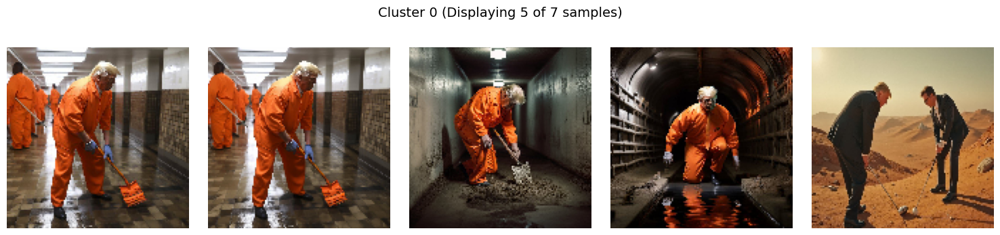


Cluster 1:


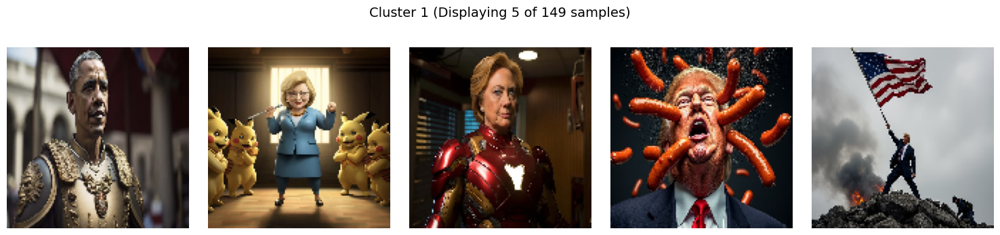


Cluster 2:


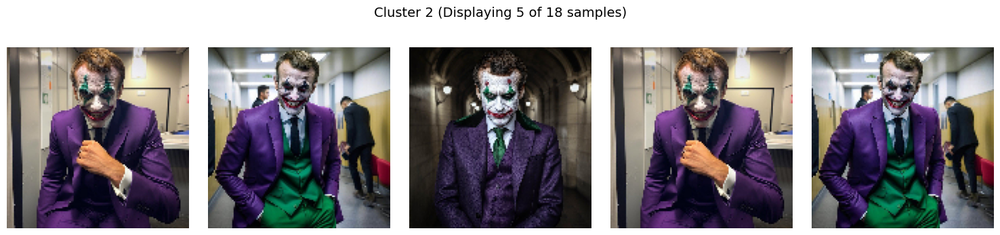


Cluster 3:


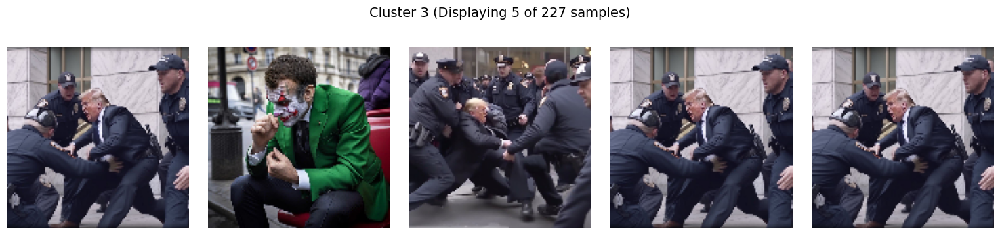


Cluster 4:


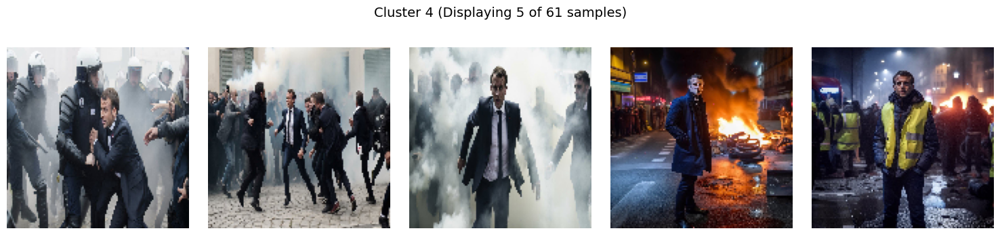


Cluster 5:


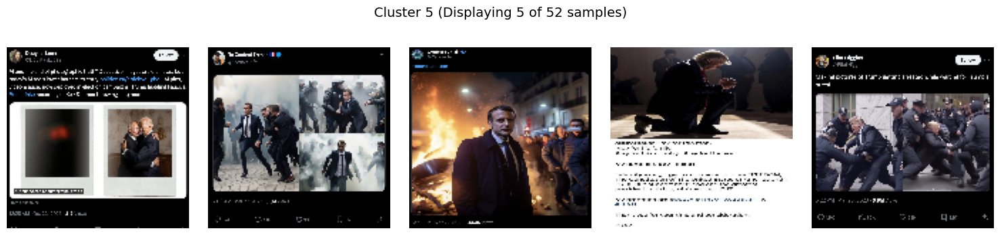


Cluster 6:


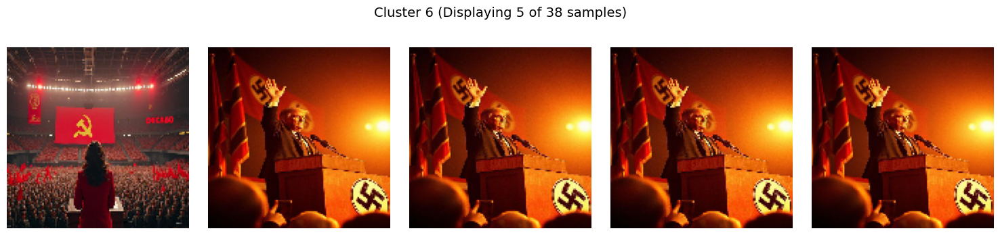

In [9]:
if 'cluster_labels' in locals() and \
   'image_paths_for_clustering' in locals() and \
   len(image_paths_for_clustering) == len(cluster_labels) and \
   len(cluster_labels) > 0:

    print("\n--- Analyzing Clusters (Displaying sample images in subplots per cluster) ---")

    num_clusters_k = k if ('k' in locals() and isinstance(k, int)) else len(np.unique(cluster_labels))

    for cluster_num in range(num_clusters_k):
        print(f"\nCluster {cluster_num}:")

        cluster_image_paths = [image_paths_for_clustering[i] for i, label in enumerate(cluster_labels) if label == cluster_num]

        if not cluster_image_paths:
            print("  No images found in this cluster.")
            continue

        num_samples_to_display = min(len(cluster_image_paths), 5)

        fig, axes = plt.subplots(1, num_samples_to_display, figsize=(3 * num_samples_to_display, 3.5))
        if num_samples_to_display == 1:
            axes = [axes]

        fig.suptitle(f"Cluster {cluster_num} (Displaying {num_samples_to_display} of {len(cluster_image_paths)} samples)", fontsize=14)

        for i in range(num_samples_to_display):
            img_path = cluster_image_paths[i]
            ax = axes[i]
            try:
                img_display = keras_image.load_img(img_path, target_size=(128, 128))
                ax.imshow(img_display)
            except Exception as e:
                print(f"    Could not load/display image {img_path}: {e}")
                ax.text(0.5, 0.5, 'Error loading', ha='center', va='center', fontsize=9)
            finally:
                ax.axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
else:
    if not ('cluster_labels' in locals() and len(cluster_labels) > 0):
        print("Cluster labels not available or empty. Cannot display cluster images.")
    elif not ('paths_corresponding_to_features' in locals()):
        print("List of image paths ('paths_corresponding_to_features') not available.")
    elif len(image_paths_for_clustering) != len(cluster_labels):
        print("Mismatch between the number of image paths and cluster labels. Cannot reliably display cluster images.")

We identify cluster 5 as the "screenshot" cluster, which contains UI-style images that do not convey social or news content. This cluster is removed from the dataset to avoid wasted compute on irrelevant images (with some exceptions that were noted manually).

Found 52 images in Cluster 5. Displaying all of them...


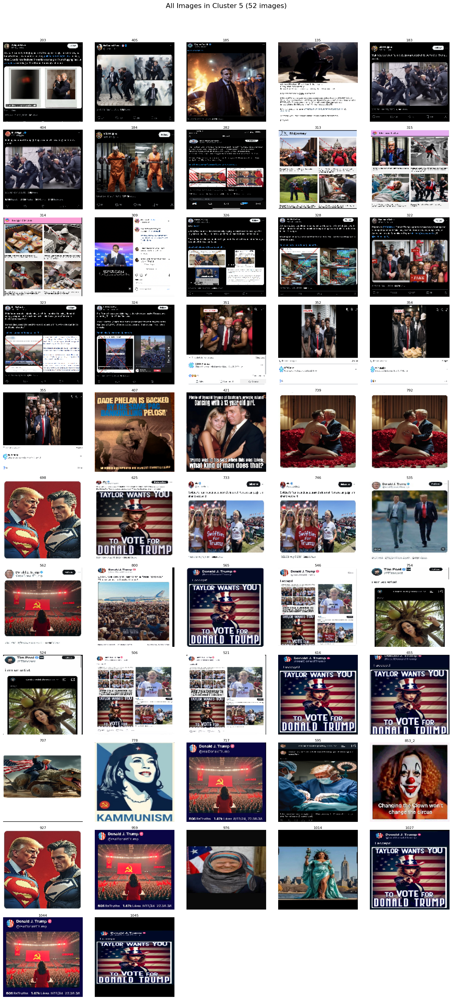

In [11]:
target_cluster_label = 5

if 'image_paths_for_clustering' not in locals() or \
   'cluster_labels' not in locals() or \
   len(image_paths_for_clustering) != len(cluster_labels):
    print("Error: 'image_paths_for_clustering' or 'cluster_labels' are not properly defined, or their lengths mismatch.")
    print("Cannot proceed with displaying cluster images.")
else:
    images_in_target_cluster = [
        image_paths_for_clustering[i]
        for i, label in enumerate(cluster_labels)
        if label == target_cluster_label
    ]

    if not images_in_target_cluster:
        print(f"No images found in Cluster {target_cluster_label}.")
    else:
        N = len(images_in_target_cluster)
        print(f"Found {N} images in Cluster {target_cluster_label}. Displaying all of them...")

        ncols = 5
        nrows = math.ceil(N / ncols)

        subplot_size_factor = 3
        figsize_width = ncols * subplot_size_factor
        figsize_height = nrows * subplot_size_factor

        fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_width, figsize_height))

        if nrows * ncols == 1:
            axes_flat = np.array([axes])
        elif isinstance(axes, np.ndarray):
            axes_flat = axes.flatten()
        else:
            axes_flat = np.array([axes])


        fig.suptitle(f"All Images in Cluster {target_cluster_label} ({N} images)", fontsize=16)

        for i, img_path in enumerate(images_in_target_cluster):
            ax = axes_flat[i]
            try:
                # Ensure keras_image is available if you use this line
                img_display = keras_image.load_img(img_path, target_size=(150, 150)) # Moderate display size
                ax.imshow(img_display)
                # Optional: Add filename as title to each subplot
                ax.set_title(os.path.basename(img_path).split('.')[0], fontsize=8, pad=2)
            except Exception as e:
                print(f"    Could not load/display image {img_path}: {e}")
                ax.text(0.5, 0.5, 'Error loading', ha='center', va='center', fontsize=9)
            finally:
                ax.axis('off') # Always turn off axis

        for j in range(N, len(axes_flat)):
            axes_flat[j].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

In [12]:
import shutil

output_folder_name = "images_no_sc"

cluster5_to_keep = {'407', '421', '778', '698', '853_2', '927'}
cluster3_to_discard = {'329'}
cluster6_to_discard = {'704', '901', '977'}

# --- Ensure prerequisite variables are available ---
if 'image_paths_for_clustering' not in locals() or \
   'cluster_labels' not in locals():
    print("Error: 'image_paths_for_clustering' or 'cluster_labels' not found.")
    print("Please ensure these lists are populated from your clustering results.")
elif len(image_paths_for_clustering) != len(cluster_labels):
    print("Error: Mismatch between the number of image paths and cluster labels.")
    print("Cannot reliably proceed with filtering.")
else:
    # --- Create the output directory ---
    try:
        os.makedirs(output_folder_name, exist_ok=True)
        print(f"Output folder '{output_folder_name}' is ready.")
    except Exception as e:
        print(f"Error creating output folder '{output_folder_name}': {e}")

    images_copied_count = 0
    images_discarded_count = 0
    processed_images_count = len(image_paths_for_clustering)

    print(f"\nProcessing {processed_images_count} images based on your rules...")

    for i in range(processed_images_count):
        current_path = image_paths_for_clustering[i]
        current_label = cluster_labels[i]

        filename = os.path.basename(current_path)
        current_id_for_exceptions = os.path.splitext(filename)[0]

        should_keep = False

        if current_label == 5:  # Rules for Cluster 5 (screenshots)
            if current_id_for_exceptions in cluster5_to_keep:
                should_keep = True
        elif current_label == 3: # Rules for Cluster 3
            if current_id_for_exceptions not in cluster3_to_discard:
                should_keep = True
        elif current_label == 6: # Rules for Cluster 6
            if current_id_for_exceptions not in cluster6_to_discard:
                should_keep = True
        elif current_label in [0, 1, 2, 4]: # Clusters 0, 1, 2, 4 are kept entirely
            should_keep = True
        else:
            # This handles any unexpected cluster labels
            print(f"Warning: Image '{filename}' (ID: {current_id_for_exceptions}) is in unhandled Cluster {current_label}. It will be discarded.")
            should_keep = False

        # --- Copy file if it should be kept ---
        if should_keep:
            destination_path = os.path.join(output_folder_name, filename)
            try:
                shutil.copy2(current_path, destination_path)
                images_copied_count += 1
            except Exception as e:
                print(f"Error copying '{filename}' to '{destination_path}': {e}")
                images_discarded_count +=1
        else:
            images_discarded_count += 1

    print(f"\n--- Summary ---")
    print(f"Total images processed: {processed_images_count}")
    print(f"Images copied to '{output_folder_name}': {images_copied_count}")
    print(f"Images discarded (not copied): {images_discarded_count}")

Output folder 'images_no_sc' is ready.

Processing 552 images based on your rules...

--- Summary ---
Total images processed: 552
Images copied to 'images_no_sc': 502
Images discarded (not copied): 50


In [ ]:
source_directory_name = "images_no_sc"
destination_parent_directory = "/content/drive/MyDrive/CSM 2025/"
final_destination_path = os.path.join(destination_parent_directory, source_directory_name)

shutil.move(source_directory_name, destination_parent_directory)
print(f"Successfully moved '{source_directory_name}' to '{destination_parent_directory}'.")
print(f"Final path: '{final_destination_path}'")

Successfully moved 'images_no_sc' to '/content/drive/MyDrive/CSM 2025/'.
Final path: '/content/drive/MyDrive/CSM 2025/images_no_sc'


--- Part 1: Loading images from '/content/drive/MyDrive/CSM 2025/images_no_sc/' ---


Loading and preprocessing images: 100%|██████████| 502/502 [00:34<00:00, 14.75it/s]


Successfully loaded and preprocessed 502 images.

--- Part 2: Generating ResNet50 Embeddings ---
102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
ResNet50 model loaded for embedding generation.
Computing embeddings (this may take a while depending on the number of images and hardware)...
16/16 ━━━━━━━━━━━━━━━━━━━━ 103s 6s/step
Embeddings computed. Shape: (502, 2048)

--- Part 3: Computing Cosine Similarity & Grouping Duplicates ---
Computing cosine similarity matrix...
Cosine similarity matrix computed. Shape: (502, 502)
Identifying pairs with similarity > 0.93...


Finding similar pairs: 100%|██████████| 125751/125751 [00:00<00:00, 548350.36it/s]


Found 332 pairs of images exceeding the similarity threshold.
Grouping duplicate pairs...


Finalizing groups: 100%|██████████| 502/502 [00:00<00:00, 520529.20it/s]


Identified 122 groups of duplicate images.

--- Part 4: Reporting and Visualizing Duplicate Sets (Cosine Similarity > 0.93) ---
Found 122 set(s) of duplicate images:

Set 1 (contains 16 files):
  - 441.jpeg
  - 627.png
  - 653.png
  - 729.jpeg
  - 772.jpeg
  - 779.png
  - 671.jpeg
  - 548.jpeg
  - 808.jpeg
  - 728.jpeg
  - 809.png
  - 870.jpeg
  - 899.jpeg
  - 906.jpeg
  - 957.jpeg
  - 971.jpeg

Set 2 (contains 8 files):
  - 533.jpeg
  - 486.jpeg
  - 534.jpeg
  - 487.jpeg
  - 496.jpeg
  - 686.jpeg
  - 630.jpeg
  - 948.png

Set 3 (contains 4 files):
  - 136.jpeg
  - 129.jpeg
  - 424.jpeg
  - 317_2.jpeg

Set 4 (contains 4 files):
  - 130.jpeg
  - 137.jpeg
  - 317_1.jpeg
  - 883.jpeg

Set 5 (contains 4 files):
  - 448.jpeg
  - 467.png
  - 512.png
  - 876.jpeg

Set 6 (contains 4 files):
  - 451.jpeg
  - 471.png
  - 458.jpeg
  - 479.png

Set 7 (contains 4 files):
  - 454.jpeg
  - 475.png
  - 456.jpeg
  - 477.png

Set 8 (contains 4 files):
  - 602.jpeg
  - 795.jpeg
  - 624.jpeg
  - 926.jpeg


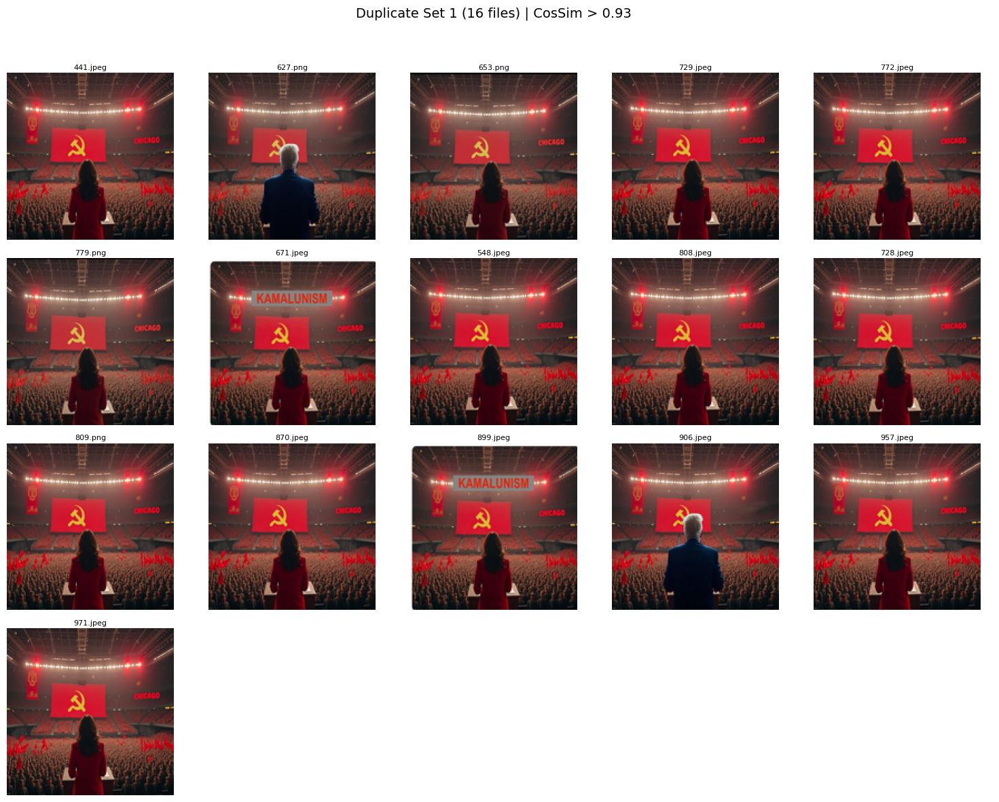


Visualizing Duplicate Set 2 (Ranked by count, 8 images):


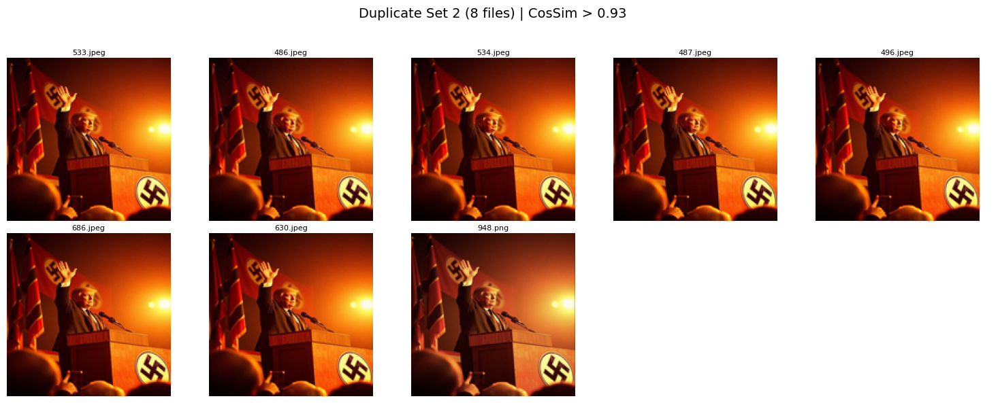


Visualizing Duplicate Set 3 (Ranked by count, 4 images):


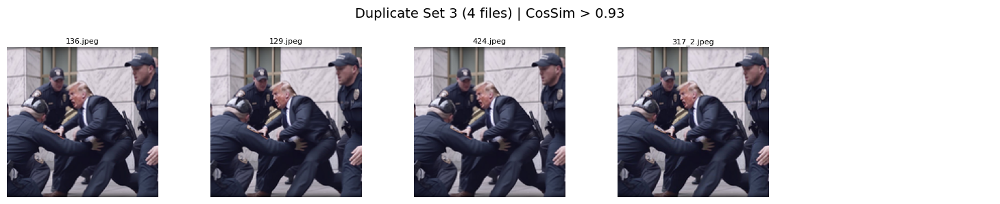


Visualizing Duplicate Set 4 (Ranked by count, 4 images):


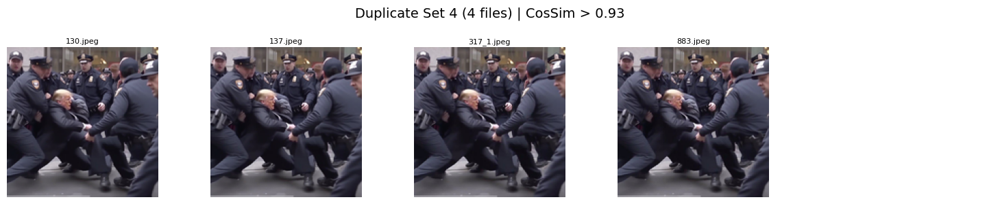


Visualizing Duplicate Set 5 (Ranked by count, 4 images):


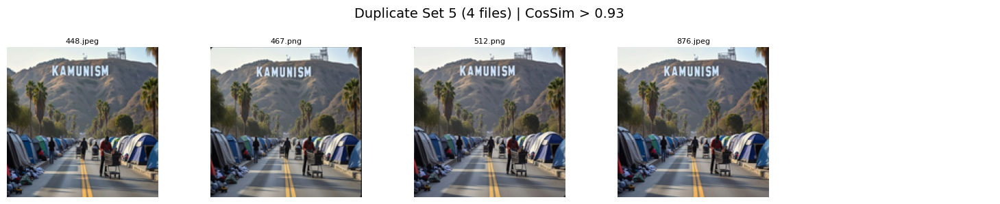


Visualizing Duplicate Set 6 (Ranked by count, 4 images):


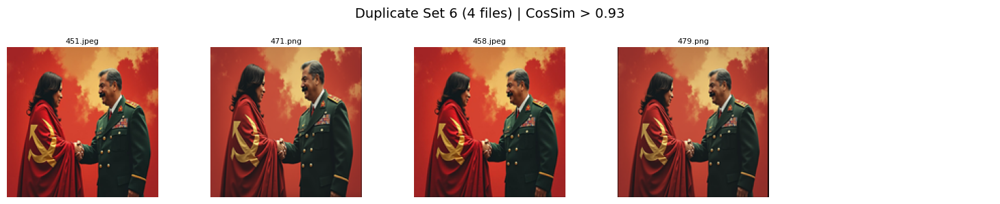


Visualizing Duplicate Set 7 (Ranked by count, 4 images):


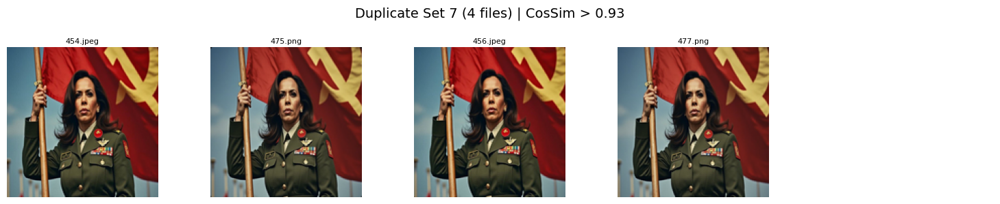


Visualizing Duplicate Set 8 (Ranked by count, 4 images):


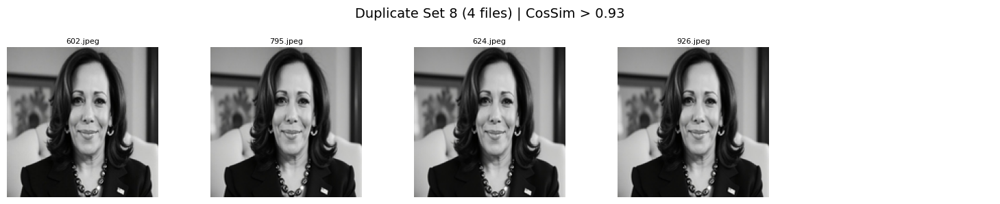


Visualizing Duplicate Set 9 (Ranked by count, 4 images):


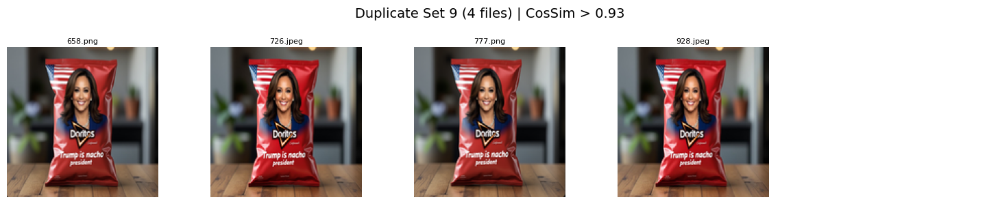


Visualizing Duplicate Set 10 (Ranked by count, 4 images):


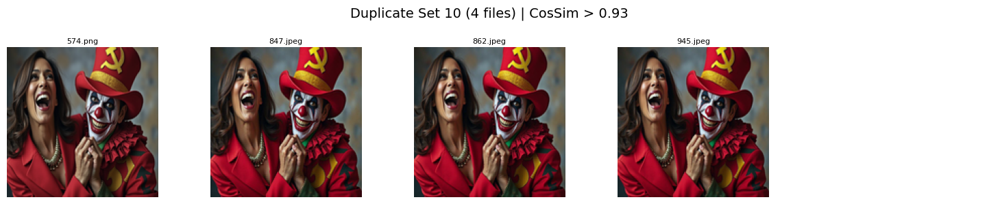

In [ ]:
from tensorflow.keras.preprocessing import image as keras_image_preprocessing

# Allow loading of truncated images (can be helpful with diverse image sources)
ImageFile.LOAD_TRUNCATED_IMAGES = True

# --- Configuration ---
image_directory = "/content/drive/MyDrive/CSM 2025/images_no_sc/"
similarity_threshold = 0.93

print(f"--- Part 1: Loading images from '{image_directory}' ---")
loaded_filenames_basenames = []
image_data_for_resnet = []
processed_full_image_paths = []

if os.path.isdir(image_directory):
    all_files_in_dir = [f for f in os.listdir(image_directory) if os.path.isfile(os.path.join(image_directory, f))]

    for filename in tqdm(all_files_in_dir, desc="Loading and preprocessing images"):
        file_path = os.path.join(image_directory, filename)
        try:
            img = keras_image_preprocessing.load_img(file_path, target_size=(224, 224))
            img_array = keras_image_preprocessing.img_to_array(img)

            image_data_for_resnet.append(img_array)
            loaded_filenames_basenames.append(filename)
            processed_full_image_paths.append(file_path)
        except Exception as e:
            print(f"Error processing file '{filename}' for ResNet50: {e}. Skipping this file.")

    if not image_data_for_resnet:
        print("CRITICAL ERROR: No images were successfully loaded. Cannot proceed with duplicate detection.")
    else:
        print(f"Successfully loaded and preprocessed {len(image_data_for_resnet)} images.")
else:
    print(f"CRITICAL ERROR: Directory '{image_directory}' not found. Please check the path.")

cosine_similarity_duplicate_sets = []

if image_data_for_resnet:
    print("\n--- Part 2: Generating ResNet50 Embeddings ---")
    try:
        base_model_resnet = ResNet50(weights='imagenet', include_top=True)
        model_resnet_embedding = Model(inputs=base_model_resnet.input, outputs=base_model_resnet.get_layer('avg_pool').output)
        print("ResNet50 model loaded for embedding generation.")
    except Exception as e:
        print(f"CRITICAL ERROR: Could not load ResNet50 model: {e}")

    img_array_for_model = np.array(image_data_for_resnet)
    img_array_preprocessed = preprocess_input(img_array_for_model)

    print("Computing embeddings (this may take a while depending on the number of images and hardware)...")
    try:
        embeddings = model_resnet_embedding.predict(img_array_preprocessed, batch_size=32, verbose=1)
        print(f"Embeddings computed. Shape: {embeddings.shape}")
    except Exception as e:
        print(f"CRITICAL ERROR: Failed to compute embeddings: {e}")
        embeddings = np.array([])

    if embeddings.ndim == 2 and embeddings.shape[0] > 0 :
        print("\n--- Part 3: Computing Cosine Similarity & Grouping Duplicates ---")
        print("Computing cosine similarity matrix...")
        cos_sim_matrix = cosine_similarity(embeddings)
        print(f"Cosine similarity matrix computed. Shape: {cos_sim_matrix.shape}")

        n_images = len(loaded_filenames_basenames)
        duplicate_pairs_indices = []

        # Efficiently get upper triangle indices (excluding diagonal)
        rows, cols = np.triu_indices(n_images, k=1)

        print(f"Identifying pairs with similarity > {similarity_threshold}...")
        for i_pair in tqdm(range(len(rows)), desc="Finding similar pairs"):
            r_idx, c_idx = rows[i_pair], cols[i_pair]
            if cos_sim_matrix[r_idx, c_idx] > similarity_threshold:
                duplicate_pairs_indices.append((r_idx, c_idx))

        print(f"Found {len(duplicate_pairs_indices)} pairs of images exceeding the similarity threshold.")

        # Group duplicates using Union-Find algorithm
        if duplicate_pairs_indices:
            parent_array = list(range(n_images))
            def find_set_root(i):
                if parent_array[i] == i:
                    return i
                parent_array[i] = find_set_root(parent_array[i])
                return parent_array[i]

            def unite_image_sets(i, j):
                root_i = find_set_root(i)
                root_j = find_set_root(j)
                if root_i != root_j:
                    parent_array[root_j] = root_i # Union by making root_j point to root_i

            print("Grouping duplicate pairs...")
            for r_idx, c_idx in tqdm(duplicate_pairs_indices, desc="Union-Find grouping"):
                unite_image_sets(r_idx, c_idx)

            # Build final groups of indices
            groups_by_root_index = defaultdict(list)
            for i_img in tqdm(range(n_images), desc="Finalizing groups"):
                root = find_set_root(i_img)
                groups_by_root_index[root].append(i_img)

            # Convert groups of indices to groups of full file paths
            for group_of_indices in groups_by_root_index.values():
                if len(group_of_indices) > 1: # Only consider actual duplicate groups
                    cosine_similarity_duplicate_sets.append([processed_full_image_paths[idx] for idx in group_of_indices])
            print(f"Identified {len(cosine_similarity_duplicate_sets)} groups of duplicate images.")
        else:
            print("No duplicate pairs found above the similarity threshold to group.")
    elif embeddings.ndim != 2 or embeddings.shape[0] == 0:
         print("Embeddings were not computed correctly. Skipping similarity and grouping.")


if cosine_similarity_duplicate_sets:
    print(f"\n--- Part 4: Reporting and Visualizing Duplicate Sets (Cosine Similarity > {similarity_threshold}) ---")
    sorted_report_sets_cs = sorted(cosine_similarity_duplicate_sets, key=len, reverse=True)
    print(f"Found {len(sorted_report_sets_cs)} set(s) of duplicate images:")
    for idx, dup_set_paths_cs in enumerate(sorted_report_sets_cs):
        print(f"\nSet {idx + 1} (contains {len(dup_set_paths_cs)} files):")
        for path_cs in dup_set_paths_cs:
            print(f"  - {os.path.basename(path_cs)}")

    # Visualization of Top 10 Duplicate Sets
    print("\n--- Visualizing Top Duplicate Sets ---")
    num_top_sets_to_visualize_cs = min(len(sorted_report_sets_cs), 10)

    if num_top_sets_to_visualize_cs == 0:
         print("No duplicate sets (with >1 image) to visualize.")

    for i_vis in range(num_top_sets_to_visualize_cs):
        current_dup_set_paths_for_vis = sorted_report_sets_cs[i_vis]
        num_images_in_set_for_vis = len(current_dup_set_paths_for_vis)

        if num_images_in_set_for_vis <= 1:
            continue

        print(f"\nVisualizing Duplicate Set {i_vis+1} (Ranked by count, {num_images_in_set_for_vis} images):")

        vis_ncols_fig = 5
        vis_nrows_fig = math.ceil(num_images_in_set_for_vis / vis_ncols_fig)

        subplot_size_factor_cs = 3.0
        fig_cs_vis, axes_cs_vis = plt.subplots(vis_nrows_fig, vis_ncols_fig,
                                           figsize=(vis_ncols_fig * subplot_size_factor_cs,
                                                    vis_nrows_fig * subplot_size_factor_cs))

        if isinstance(axes_cs_vis, np.ndarray):
            axes_flat_for_vis = axes_cs_vis.flatten()
        else:
            axes_flat_for_vis = np.array([axes_cs_vis])

        fig_cs_vis.suptitle(f"Duplicate Set {i_vis+1} ({num_images_in_set_for_vis} files) | CosSim > {similarity_threshold}", fontsize=14)

        for j_img, img_path_to_vis in enumerate(current_dup_set_paths_for_vis):
            if j_img >= len(axes_flat_for_vis):
              break
            ax_current_vis = axes_flat_for_vis[j_img]
            try:
                img_display_obj = Image.open(img_path_to_vis)
                img_display_resized_obj = img_display_obj.resize((150, 150), Image.Resampling.LANCZOS)
                ax_current_vis.imshow(img_display_resized_obj)
                ax_current_vis.set_title(os.path.basename(img_path_to_vis), fontsize=8, pad=3)
            except Exception as e:
                ax_current_vis.text(0.5, 0.5, 'Error Displaying', ha='center', va='center', fontsize=8, color='red')
            finally:
                ax_current_vis.axis('off')

        for k_ax_unused in range(num_images_in_set_for_vis, len(axes_flat_for_vis)):
            axes_flat_for_vis[k_ax_unused].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

elif image_data_for_resnet : # If images were processed but no duplicates found by cosine similarity
    print("\nNo duplicate image sets were found using the ResNet50 + cosine similarity approach.")

# Fallback if no images were initially loaded
if not image_data_for_resnet and os.path.isdir(image_directory):
    print("\nNo image files were successfully loaded from the directory, so no duplicate detection was performed.")

We want to select the "original" image to be the one with the highest engagement metrics. We initially wanted to use the date of posting, but this is not fine-grained enough in the data (i.e. duplicates can be posted on the same day).

In [ ]:
def convert_engagement_value(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, (int, float)):
        return float(val)

    val_str = str(val).strip().lower()
    val_str = val_str.replace("views", "").strip()

    multiplier = 1
    if val_str.endswith('k'):
        multiplier = 1_000
        val_str = val_str[:-1].strip() # Remove 'k' and any surrounding space
    elif val_str.endswith('m'):
        multiplier = 1_000_000
        val_str = val_str[:-1].strip() # Remove 'm' and any surrounding space

    val_str = val_str.replace(",", "")

    try:
        return float(val_str) * multiplier
    except ValueError:
        return np.nan

def clean_engagement_data(df, columns_to_clean=['likes', 'views', 'shares', 'comments']):
    df_copy = df.copy()
    for col in columns_to_clean:
        if col in df_copy.columns:
            df_copy[col] = df_copy[col].apply(convert_engagement_value)
        else:
            print(f"Warning: Column '{col}' not found during cleaning, skipping.")
    return df_copy

# --- Configuration ---
original_csv_path = "/content/drive/MyDrive/CSM 2025/data/data-2324-no-ver.csv"
output_expanded_csv_path = "/content/drive/MyDrive/CSM 2025/data/image_level_data_with_resnet_duplicates.csv"

print("--- Phase 1: Creating Expanded DataFrame (one row per image file) ---")
df_orig_engagement = None
can_proceed_phase1 = True
try:
    df_orig_engagement = pd.read_csv(original_csv_path)
    print(f"Successfully loaded original engagement data from: {original_csv_path}")
except FileNotFoundError:
    print(f"CRITICAL ERROR: Original engagement CSV not found at {original_csv_path}. Script cannot proceed.")
    can_proceed_phase1 = False

if can_proceed_phase1:
    if 'incident_id' not in df_orig_engagement.columns:
        print("CRITICAL ERROR: 'incident_id' column not found in the original engagement CSV.")
        can_proceed_phase1 = False
    else:
        df_orig_engagement['incident_id'] = df_orig_engagement['incident_id'].astype(str)

        engagement_metric_cols = ['likes', 'views', 'comments', 'shares']

        for col in engagement_metric_cols:
            if col not in df_orig_engagement.columns:
                print(f"Warning: Engagement column '{col}' not found in original CSV. It will be added as NaN before cleaning.")
                df_orig_engagement[col] = np.nan

        df_orig_engagement = clean_engagement_data(df_orig_engagement, columns_to_clean=engagement_metric_cols)
        print("Applied cleaning to engagement metric columns.")

        for col in engagement_metric_cols:
            if col in df_orig_engagement.columns:
                df_orig_engagement[col] = df_orig_engagement[col].fillna(0).astype(float)
            else:
                df_orig_engagement[col] = 0.0

        df_orig_engagement['total_engagement'] = df_orig_engagement[engagement_metric_cols].sum(axis=1)
        print("Calculated 'total_engagement' using cleaned metrics.")
        df_orig_engagement.set_index('incident_id', inplace=True)

# Check for 'processed_full_image_paths'
if can_proceed_phase1:
    if 'processed_full_image_paths' not in locals() or not isinstance(processed_full_image_paths, list):
        print("CRITICAL ERROR: 'processed_full_image_paths' variable is not defined or not a list.")
        print("This variable should be generated by your ResNet50 duplicate detection script BEFORE running this.")
        can_proceed_phase1 = False
    elif not processed_full_image_paths:
        print("Warning: 'processed_full_image_paths' is empty. No images to create the expanded DataFrame for.")
        can_proceed_phase1 = False

df_expanded_images = pd.DataFrame()
unmatched_engagement_count = 0

if can_proceed_phase1:
    # Create new expanded DataFrame using 'processed_full_image_paths'
    expanded_rows_list = []
    print(f"Building expanded DataFrame based on {len(processed_full_image_paths)} image paths from ResNet processing...")

    for file_path in tqdm(processed_full_image_paths, desc="Creating expanded rows from CSV data"):
        full_image_id = os.path.splitext(os.path.basename(file_path))[0]
        base_id_for_lookup = re.sub(r'(_\d+)$', '', full_image_id)
        try:
            engagement_data_series = df_orig_engagement.loc[base_id_for_lookup]
            new_row_data = engagement_data_series.to_dict()
            new_row_data['image_file_id_temp'] = full_image_id
            new_row_data['base_incident_id_original'] = base_id_for_lookup
            new_row_data['image_full_path'] = file_path
            expanded_rows_list.append(new_row_data)
        except KeyError:
            default_row = {
                'image_file_id_temp': full_image_id,
                'base_incident_id_original': base_id_for_lookup,
                'image_full_path': file_path,
                'total_engagement': 0.0
            }
            for col_metric in engagement_metric_cols:
                 default_row[col_metric] = 0.0
            expanded_rows_list.append(default_row)
            unmatched_engagement_count +=1

    if expanded_rows_list:
        df_expanded_images = pd.DataFrame(expanded_rows_list)
        if 'image_file_id_temp' in df_expanded_images.columns:
            df_expanded_images.rename(columns={'image_file_id_temp': 'incident_id'}, inplace=True)

        for col_metric in engagement_metric_cols:
            if col_metric not in df_expanded_images.columns:
                df_expanded_images[col_metric] = 0.0
            else:
                df_expanded_images[col_metric] = df_expanded_images[col_metric].fillna(0.0)
        if 'total_engagement' not in df_expanded_images.columns:
             df_expanded_images['total_engagement'] = 0.0
        else:
            df_expanded_images['total_engagement'] = df_expanded_images['total_engagement'].fillna(0.0)


        print(f"Created expanded DataFrame with {len(df_expanded_images)} rows.")
        if unmatched_engagement_count > 0:
            print(f"Note: {unmatched_engagement_count} images could not be matched to a base_id for full engagement metrics (defaulted to 0).")
    else:
        print("Expanded DataFrame is empty. This might be due to an empty 'processed_full_image_paths' or no data processed.")
        can_proceed_phase1 = False

# --- Apply Duplicate Information to df_expanded_images ---
can_proceed_phase2 = can_proceed_phase1 and not df_expanded_images.empty

if can_proceed_phase2:
    print("\n--- Phase 2: Applying Duplicate Information to Expanded DataFrame ---")
    df_expanded_images['is_kept_image'] = True
    df_expanded_images['is_duplicate_version'] = False
    df_expanded_images['duplicate_of_incident_id'] = pd.NA
    df_expanded_images['duplicate_set_id'] = pd.NA
    df_expanded_images['represents_images'] = None
    df_expanded_images['represents_images'] = df_expanded_images['represents_images'].astype('object')

    if 'cosine_similarity_duplicate_sets' in locals() and isinstance(cosine_similarity_duplicate_sets, list):
        print(f"Processing {len(cosine_similarity_duplicate_sets)} duplicate sets identified by ResNet+Cosine Similarity...")
        current_duplicate_set_id_counter = 0

        for dup_set_paths in cosine_similarity_duplicate_sets:
            if not dup_set_paths or len(dup_set_paths) < 2:
                continue

            current_duplicate_set_id_counter += 1
            images_data_in_this_set = []

            for file_path in dup_set_paths:
                full_image_id = os.path.splitext(os.path.basename(file_path))[0]
                matching_expanded_rows = df_expanded_images[df_expanded_images['incident_id'] == full_image_id]

                if not matching_expanded_rows.empty:
                    expanded_df_idx = matching_expanded_rows.index[0]
                    score = matching_expanded_rows.iloc[0].get('total_engagement', 0)
                    images_data_in_this_set.append({
                        'id': full_image_id,
                        'path': file_path,
                        'score': score,
                        'expanded_df_index': expanded_df_idx
                    })
                else:
                    print(f"CRITICAL INTERNAL WARNING: Image ID '{full_image_id}' from a ResNet duplicate set "
                          f"(path: {file_path}) was not found in the df_expanded_images. This indicates a mismatch.")

            if not images_data_in_this_set or len(images_data_in_this_set) < 2:
                current_duplicate_set_id_counter -=1
                continue

            images_data_in_this_set.sort(key=lambda x: (-x['score'], x['id']))

            best_image_data = images_data_in_this_set[0]
            best_image_expanded_idx = best_image_data['expanded_df_index']
            other_full_ids_in_set = [img_data['id'] for img_data in images_data_in_this_set[1:]]

            df_expanded_images.loc[best_image_expanded_idx, 'is_kept_image'] = True
            df_expanded_images.loc[best_image_expanded_idx, 'is_duplicate_version'] = False
            df_expanded_images.loc[best_image_expanded_idx, 'duplicate_of_incident_id'] = pd.NA
            df_expanded_images.loc[best_image_expanded_idx, 'duplicate_set_id'] = current_duplicate_set_id_counter
            df_expanded_images.at[best_image_expanded_idx, 'represents_images'] = other_full_ids_in_set if other_full_ids_in_set else None

            for other_image_data in images_data_in_this_set[1:]:
                other_image_expanded_idx = other_image_data['expanded_df_index']
                df_expanded_images.loc[other_image_expanded_idx, 'is_kept_image'] = False
                df_expanded_images.loc[other_image_expanded_idx, 'is_duplicate_version'] = True
                df_expanded_images.loc[other_image_expanded_idx, 'duplicate_of_incident_id'] = best_image_data['id']
                df_expanded_images.loc[other_image_expanded_idx, 'duplicate_set_id'] = current_duplicate_set_id_counter
                df_expanded_images.loc[other_image_expanded_idx, 'represents_images'] = None

        print("Finished applying duplicate information to the expanded DataFrame.")
    else:
        if 'cosine_similarity_duplicate_sets' not in locals():
            print("Warning: 'cosine_similarity_duplicate_sets' variable not found. Duplicate processing from ResNet not applied.")
        elif not isinstance(cosine_similarity_duplicate_sets, list):
            print("Warning: 'cosine_similarity_duplicate_sets' is not a list. Duplicate processing from ResNet not applied.")
        else:
            print("No ResNet-based duplicate image sets provided or found. CSV reflects no duplicates from this method.")
else:
    print("Skipping Phase 2 (Applying Duplicates) due to issues in Phase 1 or empty df_expanded_images.")


# --- Save the Expanded and Enriched DataFrame ---
if can_proceed_phase2 and not df_expanded_images.empty :
    print("\n--- Phase 3: Saving Expanded and Enriched DataFrame ---")
    try:
        df_expanded_images.to_csv(output_expanded_csv_path, index=False)
        print(f"Expanded DataFrame with per-image data and duplicate info saved to: {output_expanded_csv_path}")
    except Exception as e:
        print(f"CRITICAL ERROR: Could not save the expanded CSV to {output_expanded_csv_path}: {e}")

    print("\n--- Sample of the new Expanded DataFrame ---")
    if 'display' in locals():
        if pd.Series(df_expanded_images['duplicate_set_id']).notna().any():
            print("Showing entries that are part of a duplicate set:")
            display(df_expanded_images[df_expanded_images['duplicate_set_id'].notna()].head(10))
        else:
            print("No entries were marked as part of a duplicate set in the expanded data.")
        print("\nImages marked as 'not kept' because they are duplicate versions:")
        display(df_expanded_images[(df_expanded_images['is_kept_image'] == False) & (df_expanded_images['is_duplicate_version'] == True)].head(10))
    else:
        print("('display' function not available for showing DataFrame samples here. Data saved to CSV.)")

elif not can_proceed_phase1 :
     print(f"\nSkipping CSV processing and saving due to critical errors in Phase 1 setup.")
elif df_expanded_images.empty :
     print(f"\nSkipping CSV saving because the expanded DataFrame is empty.")

--- Phase 1: Creating Expanded DataFrame (one row per image file) ---
Successfully loaded original engagement data from: /content/drive/MyDrive/CSM 2025/data/data-2324-no-ver.csv
Applied custom cleaning to engagement metric columns.
Calculated 'total_engagement' using cleaned metrics.
Building expanded DataFrame based on 502 image paths from ResNet processing...


Creating expanded rows from CSV data: 100%|██████████| 502/502 [00:00<00:00, 7333.82it/s]

Created expanded DataFrame with 502 rows.

--- Phase 2: Applying Duplicate Information to Expanded DataFrame ---
Processing 122 duplicate sets identified by ResNet+Cosine Similarity...


Finished applying duplicate information to the expanded DataFrame.

--- Phase 3: Saving Expanded and Enriched DataFrame ---
Expanded DataFrame with per-image data and duplicate info saved to: /content/drive/MyDrive/CSM 2025/data/image_level_data_with_resnet_duplicates.csv

--- Sample of the new Expanded DataFrame ---
('display' function not available for showing DataFrame samples here. Data saved to CSV.)


In [ ]:
expanded_csv_path = "/content/drive/MyDrive/CSM 2025/data/image_level_data_with_resnet_duplicates.csv"

try:
    if 'df_expanded_images' not in locals() or df_expanded_images is None:
        print(f"Loading DataFrame from {expanded_csv_path}...")
        df_expanded_images = pd.read_csv(expanded_csv_path)
    else:
        print("Using existing 'df_expanded_images' DataFrame from memory.")
except FileNotFoundError:
    print(f"Error: The file {expanded_csv_path} was not found. Please ensure it was created successfully in the previous step.")
except Exception as e:
    print(f"An error occurred while loading the DataFrame: {e}")

if 'df_expanded_images' in locals() and isinstance(df_expanded_images, pd.DataFrame) and 'is_kept_image' in df_expanded_images.columns:
    print("\n--- Image Kept Status Counts ---")
    kept_status_counts = df_expanded_images['is_kept_image'].value_counts(dropna=False)

    kept_count = kept_status_counts.get(True, 0)
    non_kept_count = kept_status_counts.get(False, 0)

    print(f"Number of images marked to be kept: {kept_count}")
    print(f"Number of images marked as non-kept (duplicates): {non_kept_count}")

    if pd.NA in kept_status_counts or kept_status_counts.index.isna().any():
        nan_count = kept_status_counts[kept_status_counts.index.isna()].sum()
        print(f"Number of images with missing 'is_kept_image' status: {nan_count}")

    print(f"\nTotal images processed in this DataFrame: {len(df_expanded_images)}")
    if kept_count + non_kept_count != len(df_expanded_images) and not (pd.NA in kept_status_counts or kept_status_counts.index.isna().any()):
         print("Warning: The sum of kept and non-kept images does not match the total number of rows, check for missing values in 'is_kept_image'.")

elif 'df_expanded_images' in locals() and isinstance(df_expanded_images, pd.DataFrame):
    print("Error: The 'is_kept_image' column was not found in the DataFrame.")
else:
    if 'df_expanded_images' not in locals():
        print("Could not perform count as the DataFrame 'df_expanded_images' is not available.")

Using existing 'df_expanded_images' DataFrame from memory.

--- Image Kept Status Counts ---
Number of images marked to be kept: 320
Number of images marked as non-kept (duplicates): 182

Total images processed in this DataFrame: 502
